# Описание данных

Файл moscow_places.csv:
* name — название заведения;
* address — адрес заведения;
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* hours — информация о днях и часах работы;
* lat — широта географической точки, в которой находится заведение;
* lng — долгота географической точки, в которой находится заведение;
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
 * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
 * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
 * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
 * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
 * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
 * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
 * 0 — заведение не является сетевым
 * 1 — заведение является сетевым
* district — административный район, в котором находится заведение, например Центральный административный округ;
* seats — количество посадочных мест.

# Оглавление

1.  Общая информация
* Загрузка библиотек

2. Анализ данных
* Категории заведений
* Количество посадочных мест по категориям
* Cоотношение сетевых и несетевых заведений
* Категории сетевых заведений общественного питания
* Топ-15 популярных сетей в Москве
* Какие административные районы Москвы присутствуют в датасете?
* Средние рейтинги по категориям
* Картограмма (хороплет) со средним рейтингом заведений каждого района
* Заведения датасета на карте
* Топ-15 улиц по количеству заведений
* Улицы с одним обьектом общепита
* Значения средних чеков заведений
4. Детализируем исследование
5. Вывод


# Цель исследования

Подготовить исследование заведение общественного питания в городе Москве , найти интересные особенности которые помогут в выборе подходящего инвесторам места.

## Общая информация


Загрузим необходимые библиотеки

In [1]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import numpy as np
from scipy import stats as st
import matplotlib.pyplot as plt
import missingno as msno
import seaborn as sns
from datetime import datetime
from datetime import timedelta
import plotly.express as px
from plotly import graph_objects as go
import json

from folium import Map, Marker # импортируем карту и маркер
from folium.plugins import MarkerCluster # импортируем кластер
from folium import Map, Choropleth # импортируем карту и хороплет
import folium
import plotly.graph_objects as go

In [3]:
rest_data=pd.read_csv('/datasets/moscow_places.csv')

In [4]:
rest_data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [5]:
rest_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


<AxesSubplot:>

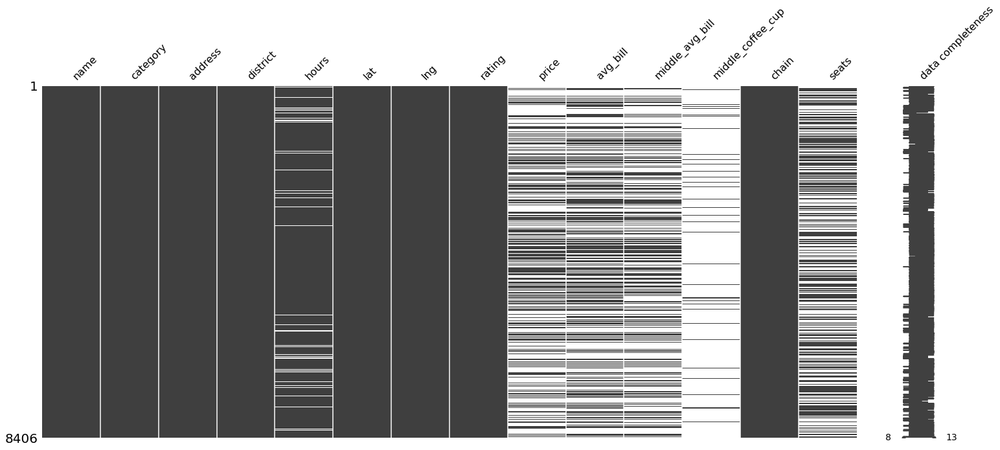

In [6]:
msno.matrix(rest_data, labels=True)  #оценим визуально пропуски в данных 

In [7]:
rest_data['name'] = rest_data['name'].str.lower()
rest_data['category'] = rest_data['category'].str.lower()
rest_data['address'] = rest_data['address'].str.lower()#приведем столбцы с названиями заведений к нижнему регистру

In [8]:
# посмотрим уникальные значения в названиях заведений
rest_data['name'].nunique()
print('Количество уникальных значений в названии заведения:', {rest_data['name'].nunique()})

Количество уникальных значений в названии заведения: {5512}


In [9]:
rest_data['name'].unique()

array(['wowфли', 'четыре комнаты', 'хазри', ..., 'миславнес', 'самовар',
       'kebab time'], dtype=object)

Данные содержат 8406 записей, 14 столбцов, в которых есть пропуски. Явных дубликатов не обнаружили. Всего 5614 заведений.

In [10]:
# Проверим датафреймы на наличие дубликатов
print('Количество явных дубликатов в датафрейме:')
print('rest_data - ', rest_data.duplicated().sum())

Количество явных дубликатов в датафрейме:
rest_data -  0


## Предобработка данных

Рассмотрим детально количество пропусков.

In [11]:
print('Наличие пропусков')
print(rest_data.isna().sum())

Наличие пропусков
name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


Пропущенные значения в столбцах 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup', 'seats' заполнить корректно не представляется возможным. Оставим как есть.

Создадим столбец 'street' с названиями улиц из столбца с адресом

In [12]:
rest_data['street'] = rest_data['address'].str.extract(pat = ',(.*?),')
rest_data['street'].sample(10)

3995                     улица арбат
3472               баррикадная улица
1742             улица бутырский вал
7436              мячковский бульвар
4072     большой саввинский переулок
3679               шмитовский проезд
7088            улица миклухо-маклая
3460             малая бронная улица
3425            улица трёхгорный вал
7477                люблинская улица
Name: street, dtype: object

In [13]:
rest_data['street'] = rest_data['street'].str.strip()
rest_data['street'].sample(10)

7755          россошанский проезд
3440        улица пресненский вал
8112           южнопортовая улица
8049     улица архитектора щусева
2088          улица сущёвский вал
5083          садовническая улица
7379       новочеркасский бульвар
1458                  улица зорге
6220              улица пудовкина
4437    нижний сусальный переулок
Name: street, dtype: object

Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

In [14]:
rest_data['is_24_7'] = rest_data['hours'].apply(lambda x: True if x == 'ежедневно, круглосуточно' else False)
rest_data[['hours', 'is_24_7']].sample(10)

,hours,is_24_7
708,"ежедневно, 10:00–20:00",False
7212,NaN,False
5191,"ежедневно, 10:00–22:00",False
3684,"ежедневно, круглосуточно",True
4885,пн-чт 09:00–01:00; пт 09:00–03:00; сб 10:00–03...,False
3084,"ежедневно, 10:00–23:00",False
1351,"пн-пт 09:00–00:00; сб,вс 10:00–00:00",False
4744,"ежедневно, 11:00–23:00",False
2995,"ежедневно, 10:00–22:00",False
1211,"ежедневно, 10:00–21:55",False


Проверим, есть ли выбросы в данных, обратим внимание на столбцы с количеством посадочных мест, и стоимостью заказа.

Text(0.5, 0, ' ')

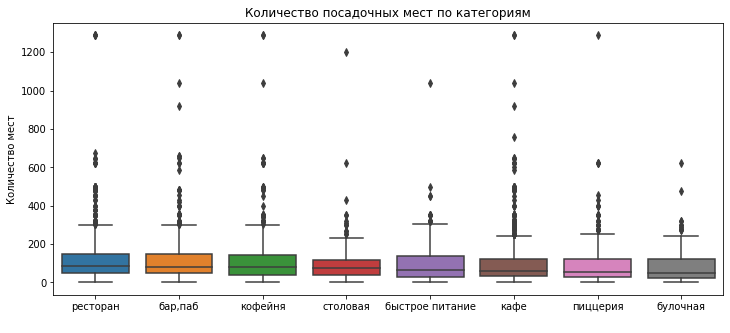

In [15]:
seats_by_category = rest_data.pivot_table(index = 'category', values = 'seats', aggfunc = 'median').sort_values(by = 'seats', ascending = False).reset_index()
seats_by_category.columns = ['category', 'seats_median'] #Найдем медианые значения
plt.figure(figsize=(12, 5)) #визуализуруем выбросы
ax = sns.boxplot(data = rest_data, x = 'category', y = 'seats', order = seats_by_category['category'])
ax.set_title('Количество посадочных мест по категориям', fontsize=12)
ax.set_ylabel('Количество мест', fontsize=10)
plt.xticks(fontsize=10)
plt.xlabel(" ")

Видим, что есть выбросы, возможно они связаны с корректностью заполнения данных.

## Анализ данных

### Категории заведений

In [16]:
# посмотрим уникальные значения в категории заведений
rest_data.groupby('category').agg({'name' : 'count'}).sort_values(by='name', ascending=False).reset_index()

,category,name
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


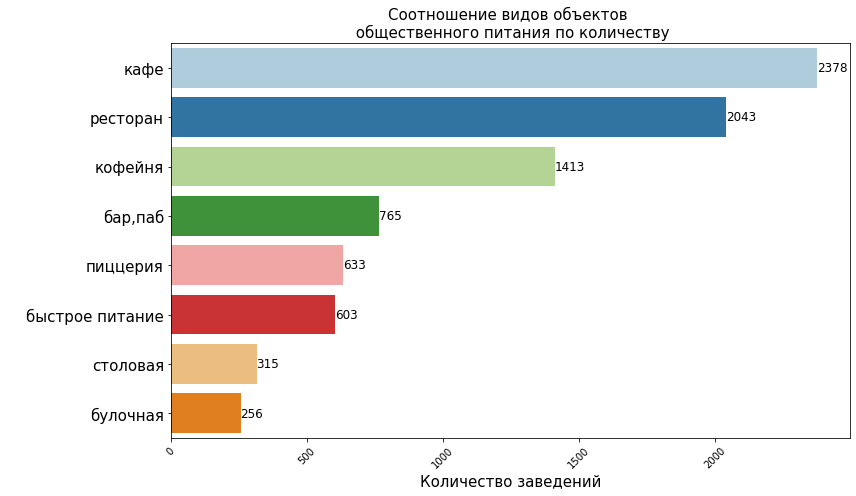

In [17]:
plt.figure(figsize=(12, 7))
ax = sns.barplot(x='name', y='category', palette='Paired', data=rest_data.groupby('category').agg({'name' : 'count'}).sort_values(by='name', ascending=False).reset_index())
plt.title('Cоотношение видов объектов \n общественного питания по количеству', size=15)
plt.xticks(rotation=45)
plt.yticks(size=15)
plt.xlabel('Количество заведений', size=15)
plt.ylabel(' ', size=15)
for p in ax.patches:
    width = p.get_width()
    plt.text(width, p.get_y() + p.get_height() / 2, '{:0.0f}'.format(width), ha='left', va='center', size=12)
plt.tight_layout() # трик, чтобы включить подписи графиков в сохраненную картинку
plt.savefig('slide1.png')
plt.show()


Большая часть заведений это кафе 2378, ресторан	2043, кофейня	1413. Меньше всего булочных и столовых.

### Количество посадочных мест по категориям

In [18]:
seats = rest_data.query('seats != -1') \
            .groupby('category') \
            .agg(seats_median=('seats', 'median')) \
            .sort_values(by='seats_median', ascending=False) \
            .reset_index()
seats['seats_median'] = seats['seats_median'].astype('int')

In [19]:
# строим столбчатую диаграмму 
fig = px.bar(seats.sort_values(by='seats_median', ascending=True), # загружаем данные и заново их сортируем
             x='seats_median', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='seats_median',
             template='plotly_white'# добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Количество посадочных мест в объектах общественного питания по категориям',
                   xaxis_title='Количество посадочных мест',
                   yaxis_title='Категория объекта общественного питания')
fig.show() # выводим график

Рестораны предоставляют наибольшее количество мест для посадки, что логично, поскольку такая специализация предполагает отдых и питание гостей. На втором месте - быстрые рестораны, при этом они являются самыми распространенными заведениями. В то же время, кафе и столовые предлагают наименьшее количество мест для посадки.

### Cоотношение сетевых и несетевых заведений

Подсчитаем число сетевых и несетевых заведений.

Text(0.5, 1.0, 'Соотношение сетевых и несетевых заведений по количеству')

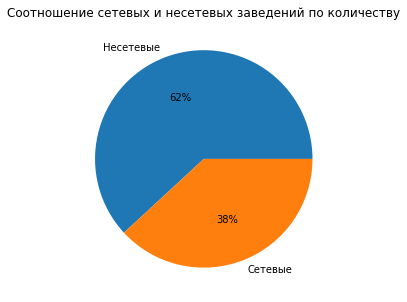

In [20]:
chain = rest_data.groupby('chain')['chain'].count()
labels = ['Несетевые', 'Сетевые']
fig1, ax1 = plt.subplots(figsize=(5,5))
ax1.pie(chain, labels=labels, autopct='%1.0f%%')
ax1.set_title('Соотношение сетевых и несетевых заведений по количеству')

Можно утверждать, что примерно 62% ресторанов в Москве не принадлежат к какой-либо сети.

### Категории сетевых заведений общественного питания

In [21]:
# Посмотрим какие категории заведений чаще являются сетевыми
chain_objects = rest_data.groupby(['category', 'chain'])['name'].count().reset_index()
chain_objects.columns = ['object_type', 'chain', 'count']
chain_objects['chain'] = chain_objects['chain'].astype(str)
chain_objects['chain'] = chain_objects['chain'].replace({0: 'Несетевые', 1: 'Сетевые'})
chain_objects = chain_objects.sort_values(['count', 'chain'])
chain_objects

,object_type,chain,count
15,столовая,1,88
2,булочная,0,99
3,булочная,1,157
1,"бар,паб",1,169
14,столовая,0,227
5,быстрое питание,1,232
10,пиццерия,0,303
11,пиццерия,1,330
4,быстрое питание,0,371
0,"бар,паб",0,596


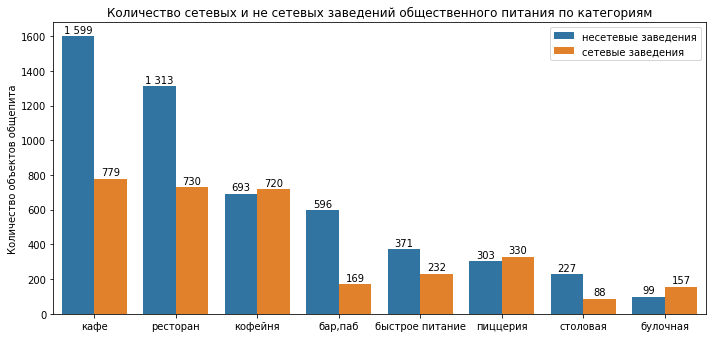

In [22]:
plt.figure(figsize=(10,5))
labels=["несетевые заведения", "сетевые заведения"]
ax = sns.barplot(x = 'category',
            y = 'name',
            hue = 'chain',
            data = rest_data.groupby(['category','chain'], as_index = False).agg({'name':'count'})
                 .sort_values(by = 'name', ascending = False))
ax.set_xticklabels(ax.get_xticklabels(), size=10)
for p in ax.patches:
    ax.annotate(format(int(p.get_height()), ',').replace(',', ' '),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, 6),
                   textcoords = 'offset points', size=10)
plt.title('Количество сетевых и не сетевых заведений общественного питания по категориям')
plt.xlabel('Категория общепита')
plt.ylabel('Количество объектов общепита')
h, l = ax.get_legend_handles_labels()
ax.legend(h, labels)
plt.xlabel(" ")
plt.tight_layout()

Согласно графику, большинство заведений не относятся к сетевым, за исключением нескольких категорий: для кофеен количество сетевых заведений незначительно превышает количество независимых (730/693); для пиццерий количество сетевых заведений уже значительно превышает количество независимых (330/303); для булочных разница между сетевыми и независимыми заведениями оказалась самой большой (157/99).

### Топ-15 популярных сетей в Москве

In [23]:
df_top_15 = rest_data[rest_data['chain'] == True].pivot_table(index = ['category', 'name'], values = 'chain', aggfunc = 'count')\
         .sort_values(by = 'chain', ascending = False).reset_index().head(15)
df_top_15.columns = ['category', 'name', 'count']
df_top_15

,category,name,count
0,кофейня,шоколадница,119
1,пиццерия,домино'с пицца,76
2,пиццерия,додо пицца,74
3,кофейня,one price coffee,71
4,ресторан,яндекс лавка,69
5,кофейня,cofix,65
6,ресторан,prime,49
7,кофейня,кофепорт,42
8,кафе,кулинарная лавка братьев караваевых,39
9,ресторан,теремок,36


In [24]:
fig = px.sunburst(df_top_15, path = ['category', 'name'], values  = 'count',
                  height = 600, width = 1000,
                  hover_data = ['count'])
fig.update_layout(margin = dict(t = 45, l = 10, r = 10, b = 10),
                  title_text = 'Топ-15 популярных сетей в Москве и их категории',
                  title_x = 0.5)
fig.show()

In [25]:
df_top_15_category = df_top_15.groupby('category')['count'].sum().reset_index()
df_top_15_category['prc'] = round(df_top_15_category['count'] / df_top_15_category['count'].sum() * 100, 1)
df_top_15_category['prc'] = df_top_15_category['prc'].astype('str')+'%'
df_top_15_category.sort_values('count', ascending = False)

,category,count,prc
2,кофейня,350,45.6%
4,ресторан,154,20.1%
3,пиццерия,150,19.5%
1,кафе,89,11.6%
0,булочная,25,3.3%


Большинство из самых популярных заведений сетевого типа в топ-15 относятся к категории "Кофейня", что является логичным. Аналогично, наименее популярной категорией является "Булочная".

In [26]:
# check
x = rest_data.copy()
df_chain = x[x['chain'] == 1]
  
(
    df_chain
    .groupby(['name', 'category']).agg(count_name=('name', 'count')).sort_values(by='count_name').tail(15)
    .reset_index()
    .groupby('category')['count_name'].sum()
    .to_frame()
    .assign(percent_total=lambda x: x / x.sum()).round(2)
    .sort_values(by='percent_total')
)

,count_name,percent_total
category,,
булочная,25,0.03
кафе,89,0.12
пиццерия,150,0.20
ресторан,154,0.20
кофейня,350,0.46


###  Какие административные районы Москвы присутствуют в датасете?

Посмотрим какие административные районы Москвы присутствуют в датасете. Отобразим общее количество заведений и количество заведений каждой категории по районам.

In [27]:
print('Общее количество заведений в датасете:',rest_data['name'].count())

Общее количество заведений в датасете: 8406


In [28]:
district_chain_df = rest_data.groupby(['district', 'category']).agg({'rating' : 'median', 'name' : 'count'})
district_chain_df = district_chain_df.sort_values('rating', ascending = False).reset_index()
district_chain_df = district_chain_df.rename(columns={'name':'count'})
district_chain_df.head(10)

,district,category,rating,count
0,Центральный административный округ,"бар,паб",4.5,364
1,Западный административный округ,"бар,паб",4.5,50
2,Северо-Западный административный округ,"бар,паб",4.4,23
3,Центральный административный округ,ресторан,4.4,670
4,Центральный административный округ,пиццерия,4.4,113
5,Юго-Западный административный округ,"бар,паб",4.4,38
6,Центральный административный округ,булочная,4.4,50
7,Южный административный округ,"бар,паб",4.4,68
8,Южный административный округ,булочная,4.4,25
9,Юго-Восточный административный округ,"бар,паб",4.4,38


In [29]:
fig = px.bar(district_chain_df,
             x='count',
             y='district',
             template='plotly_white',                    
             color='category'
            )
# оформляем график
fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название района',
                   yaxis={'categoryorder':'total ascending'}
                )
fig.show()

Рассмотрим детально районы исключая ЦАО, тк в нем наибольшее количество заведений и он искажает выборку.

In [30]:
district_chain_df['count_relative'] = district_chain_df['count'] / district_chain_df['count'].sum()
district_chain_df = district_chain_df.query('district != "Центральный административный округ"')
district_chain_df

,district,category,rating,count,count_relative
1,Западный административный округ,"бар,паб",4.50,50,0.005948
2,Северо-Западный административный округ,"бар,паб",4.40,23,0.002736
5,Юго-Западный административный округ,"бар,паб",4.40,38,0.004521
7,Южный административный округ,"бар,паб",4.40,68,0.008089
8,Южный административный округ,булочная,4.40,25,0.002974
...,...,...,...,...,...
67,Юго-Восточный административный округ,кафе,4.20,282,0.033547
68,Северный административный округ,быстрое питание,4.15,58,0.006900
69,Западный административный округ,быстрое питание,4.10,62,0.007376
70,Юго-Восточный административный округ,быстрое питание,4.10,67,0.007970


In [31]:
fig = px.bar(district_chain_df,
             x='count_relative',
             y='district',
             template='plotly_white',
             color='category'
            )

# оформляем график
fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название района',
                   yaxis={'categoryorder': 'total ascending'},
                   autosize=True
                )
fig.update_traces(texttemplate='%{x:.2f}', textposition='outside')
fig.show()

Мы имеем 9 административных округов. График показывает, что наибольшее количество заведений всех категорий находится в центральном административном округе. В основном, это кафе, кофейни и рестораны, что логично, учитывая, что люди едут в центр города, чтобы отдохнуть, погулять или сделать покупки. Категория кафе имеет неплохое распределение по всем округам. В то же время столовых наименьшее количество в каждом из округов. Наименьшее количество заведений в Северо-западном административном округе Москвы. На более детальном графике мы видим, что в других районах картина примерна такая же, преимуществено лидируют кафе, рестораны, кофейни.

### Средние рейтинги по категориям

Визуализируем распределение средних рейтингов по категориям заведений.

In [32]:
rating_category = rest_data.groupby('category').agg({'rating' : 'mean'}).round(2).sort_values('rating', ascending = False).reset_index()
rating_category

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [33]:
fig = px.bar(rating_category,
             x='rating',
             y='category',
             text='rating',
             template='plotly_white', 
             color='category'                   
            )
# оформляем график
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                   xaxis_title='Рейтинг',
                   yaxis_title='Название категорий')
fig.update_xaxes(range=[4, 4.4])
fig.show()

Согласно данным на графике, бары и пабы имеют наивысший рейтинг (Можно предположить что это связано в наличием алкоголя в ассортименте), тогда как пиццерии, рестораны, кофейни и булочные имеют примерно одинаковый рейтинг. Рестораны быстрого питания имеют наименьший рейтинг. Кроме того, средние значения по всем категориям превышают 4 в нашей выборке.

### Картограмма (хороплет) со средним рейтингом заведений каждого района

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson

In [35]:
rating_df = rest_data.groupby('district', as_index=False)['rating'].agg('mean').round(2)
rating_df

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [36]:
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [37]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    #fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

На основании предоставленных данных можно сделать вывод о том, что у заведений, расположенных в Центральном административном округе, наивысший рейтинг, составляющий 4.38. В то же время заведения, расположенные в Юго-Восточном административном округе, имеют наименьший рейтинг, который составляет 4.1

### Заведения датасета на карте

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [38]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
rest_data.apply(create_clusters, axis=1)

# выводим карту
m

По карте отчетливо видно, что основная масса заведений сконцентрирована в центре Москвы. Уже меньше на севере и еще меньше на юге.

### Топ-15 улиц по количеству заведений

Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.

In [39]:
# выведем Топ-15 улиц по количеству заведений на них
df_streets_top = rest_data['street'].value_counts().head(15).reset_index()
df_streets_top.columns = ['street','count_sum']
df_streets_top

,street,count_sum
0,проспект мира,184
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,75
8,ленинградское шоссе,69
9,мкад,65


In [40]:
# выведем название улицы, категории и количество заведений в этой категории

df_streets_cat = rest_data.groupby(['street', 'category'], as_index=False)['name'].count().sort_values(by='name', ascending=False)
df_streets_cat.columns = ['street', 'category', 'counts']
df_streets_cat

,street,category,counts
2077,проспект мира,кафе,53
2080,проспект мира,ресторан,45
1495,мкад,кафе,45
2078,проспект мира,кофейня,36
2089,профсоюзная улица,кафе,35
...,...,...,...
1503,можайское шоссе,ресторан,1
1504,молдавская улица,ресторан,1
1505,молодогвардейская улица,булочная,1
1506,молодогвардейская улица,кафе,1


In [41]:
df_streets_top = df_streets_cat.merge(df_streets_top, how='inner', on='street')
df_streets_top

,street,category,counts,count_sum
0,проспект мира,кафе,53,184
1,проспект мира,ресторан,45,184
2,проспект мира,кофейня,36,184
3,проспект мира,быстрое питание,21,184
4,проспект мира,"бар,паб",12,184
...,...,...,...,...
106,улица вавилова,быстрое питание,11,55
107,улица вавилова,кофейня,10,55
108,улица вавилова,пиццерия,3,55
109,улица вавилова,"бар,паб",2,55


In [42]:
df_streets_top['percent'] = round(df_streets_top['counts'] / df_streets_top['count_sum'] * 100, 2)
df_streets_top.columns = ['street', 'category', 'count', 'count_street', 'percent']
df_streets_top = df_streets_top.sort_values(by = 'count_street', ascending = False)
df_streets_top.head(20)

,street,category,count,count_street,percent
0,проспект мира,кафе,53,184,28.80
2,проспект мира,кофейня,36,184,19.57
3,проспект мира,быстрое питание,21,184,11.41
4,проспект мира,"бар,паб",12,184,6.52
5,проспект мира,пиццерия,11,184,5.98
6,проспект мира,булочная,4,184,2.17
7,проспект мира,столовая,2,184,1.09
1,проспект мира,ресторан,45,184,24.46
16,профсоюзная улица,кофейня,18,122,14.75
21,профсоюзная улица,столовая,3,122,2.46


In [43]:
fig = px.bar(df_streets_top,
             x='count',
             y='street',
             color='category',
             text='percent',
             orientation='h',
             labels={"count": "Количество заведений",
                     "street": "Название улицы",
                     "category": "Категория"},
             title='Распределение категорий по ТОП-15 улицам',
             template='plotly_white',
             height=800)

fig.update_traces(textfont_size=10, textangle=0)

fig.show()

По количеству заведений лидирует проспект Мира - 184 заведений( Возможно, из за своей протяжености), в конце списка улица Пятницкая - 48 заведений. Из графика выше мы видим, что больше всего заведений на проспекте Мира. Преобладают категории кафе и рестораны. Столовых меньше всего. Следом за ним идет Профсоюзная, ситуация с категориями там аналогична. Среди популярных категорий также кафе и рестораны.

### Улицы с одним обьектом общепита

In [45]:
df_streets_one_cafe = rest_data.groupby(['street'])['name'].nunique().to_frame().index
df_streets_one_cafe 

Index(['1-й автозаводский проезд', '1-й балтийский переулок',
       '1-й варшавский проезд', '1-й вешняковский проезд',
       '1-й волоколамский проезд', '1-й голутвинский переулок',
       '1-й грайвороновский проезд', '1-й дербеневский переулок',
       '1-й дорожный проезд', '1-й земельный переулок',
       ...
       'юрьевский переулок', 'якиманский переулок',
       'яковоапостольский переулок', 'ярославская улица', 'ярославское шоссе',
       'ярцевская улица', 'ясеневая улица', 'ясногорская улица',
       'яузская улица', 'яузский бульвар'],
      dtype='object', name='street', length=1393)

В названиях многих улиц с одним заведением общепита присутствуют слова "проезд", "переулок", что говорит о том, что это короткие улицы.

In [46]:
df_district_one_cafe = rest_data.pivot_table(index = ['district', 'street'], values = 'name', aggfunc = 'count').reset_index()
df_district_one_cafe = df_district_one_cafe.query('name==1')
df_district_one_cafe

,district,street,name
0,Восточный административный округ,1-й кирпичный переулок,1
3,Восточный административный округ,1-я боевская улица,1
6,Восточный административный округ,1-я парковая улица,1
7,Восточный административный округ,11-я парковая улица,1
8,Восточный административный округ,12-я парковая улица,1
...,...,...,...
1421,Южный административный округ,улица речников,1
1422,Южный административный округ,улица садовники,1
1425,Южный административный округ,улица стасовой,1
1426,Южный административный округ,улица трофимова,1


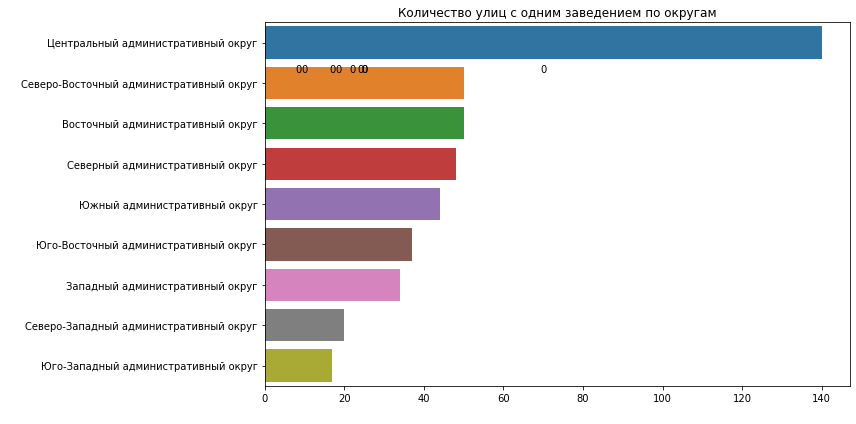

In [47]:
plt.figure(figsize=(12, 6))
ax = sns.countplot(y = 'district', data = df_district_one_cafe,
                   order = df_district_one_cafe['district'].value_counts().index)
ax.set_title('Количество улиц с одним заведением по округам', fontsize = 12)
for p in ax.patches:
    ax.annotate(format(int(p.get_height()), ',').replace(',', ' '),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, 6),
                   textcoords = 'offset points', size = 10)
plt.xlabel(" ")
plt.ylabel(" ")
plt.tight_layout()

In [48]:
result = df_district_one_cafe.merge(rest_data, on='street', how='left')

In [49]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    folium.Marker(
        location=[row['lat'], row['lng']],
        popup=f"{row['street']} {row['rating']}"
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
result.apply(create_clusters, axis=1)

# выводим карту
m

### Значения средних чеков заведений

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района. Используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района.

In [50]:
median_bill = rest_data.groupby('district')['middle_avg_bill'].median().reset_index()

In [51]:
median_bill.head(10)

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [52]:
fig = px.bar(median_bill,
             x='middle_avg_bill',
             y='district',
             template='plotly_white'          
            )
# оформляем график
fig.update_layout(title='Значения средних чеков заведений',
                   xaxis_title='Медиана средних чеков',
                   yaxis_title='Район')
fig.update_traces(textposition='inside', text=median_bill['middle_avg_bill'])  # указываем текст для каждого столбца
fig.show()

Из приведенных данных можно сделать вывод, что Центральный и Западный округа имеют наибольший средний чек в сравнении с Юго-Восточным округом, который имеет наименьший средний чек. Округи вблизи Центрального округа имеют в среднем средний чек на 1,5 - 2 раза выше, чем округа вдали от центра.

Подведем итог: Анализ показывает, что в Москве наибольшее количество заведений - кафе (2378), немного меньше - рестораны (2043), и наименьшее количество - булочные (256).
Кафе и рестораны составляют около 52,6% от общего числа заведений, в то время как кофейни, бары/пабы и пиццерии составляют 33,43%, а булочные, столовые и заведения быстрого питания - 13,97%. Рестораны предлагают наибольшее количество посадочных мест, а заведения быстрого питания распространены шире всего. Кофейни лидируют по количеству сетевых заведений, за которыми следует категория пиццерий.Самой популярной сетью является "Шоколадница". 

Количество заведений категорий кофе, ресторанов и пиццерий примерно одинаковое среди топ-15. Заведений из топ-15 в ЦАО больше всего, а в СЗАО - наименьшее количество.Проспект Мира - улица с наибольшим количеством заведений, преобладают кафе и рестораны, а меньше всего - столовые. Средний чек выше всего в центральном и западном округах, а наименьший - в юго-восточном.

## Детализируем исследование

Посчитаем количество и посмотрим на их расположение.

In [54]:
df_cafe = rest_data.query('category == "кофейня"').pivot_table(index = 'district', values = 'name', aggfunc='count').reset_index().sort_values(by = 'name', ascending=False)
df_cafe.columns = ['district', 'count']
print('Общее количество кофеен в Москве:', df_cafe['count'].sum())
df_cafe

Общее количество кофеен в Москве: 1413


,district,count
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [55]:
fig = px.bar(df_cafe,
             x='count',
             y='district',
             template='plotly_white'          
            )
# оформляем график
fig.update_layout(title='Количество кофеен в г. Москва',
                   xaxis_title='Количество кофеен ',
                   yaxis_title='Район')
fig.update_traces(textposition='inside', text=df_cafe['count'])  # указываем текст для каждого столбца
fig.show()

In [56]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

choropleth = folium.Choropleth(
    geo_data = state_geo,
    data = df_cafe,
    columns = ['district', 'count'],
    key_on = 'feature.name',
    fill_color = 'YlGn',
    fill_opacity = 0.5,
    legend_name = 'Общее количество кофеен в Москве',
).add_to(m)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(fields = ['name'], aliases = ['Округ:'],
                                   labels  =True, localize = True, sticky = False))
m

У нас имеется 1413 кофейных мест. Большинство из них расположены в Центральном районе. За ними следуют юго-западные и северные части города.

Посмотрим, есть ли круглосуточные кофейни.

In [57]:
print('Количество кофеен работающих круглосуточно:', rest_data[((rest_data['category'] == "кофейня") &
                                                                (rest_data['is_24_7'] == True))]['is_24_7'].count())
     

Количество кофеен работающих круглосуточно: 59


Оценим рейтинги кофеен по округам

In [58]:
df_cafe_rating = (
    rest_data
    .query('category == "кофейня"')
    .pivot_table(index='district', values='rating', aggfunc='mean')
    .reset_index()
    .sort_values(by='rating', ascending=False)
)
df_cafe_rating.columns = ['district', 'avg_rating']
df_cafe_rating

,district,avg_rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


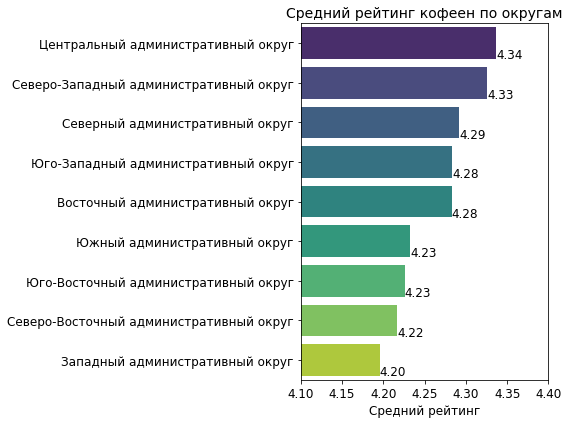

In [59]:
plt.figure(figsize=(8, 6))
ax = sns.barplot(data=df_cafe_rating, y='district', x='avg_rating', palette='viridis')
ax.set_title('Средний рейтинг кофеен по округам', fontsize=14)
ax.set_xlabel('Средний рейтинг', fontsize=12)
ax.set_ylabel('', fontsize=12)
ax.set_xlim(4.1, 4.4)

for p in ax.patches:
    width = p.get_width()
    ax.text(width,       
            p.get_y() + p.get_height() / 2. + 0.3,  
            '{:1.2f}'.format(width), 
            ha = 'left', 
            va = 'center', 
            size=12)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

Разброс рейтинга кофеен по районам не большой: максимальный рейтинг в Центральном административном округе - 4.34 и Северо-Западном административном округе - 4.33, а минимальный в Западном - 4.20.

In [60]:
df_midian_coffee_cup = (rest_data.query('category == "кофейня"')
                        .pivot_table(index = 'district', values='middle_coffee_cup', aggfunc='median')
                        .sort_values(by='middle_coffee_cup', ascending=False)
                        .reset_index())
df_midian_coffee_cup.columns = ['district', 'mean_bill']
df_midian_coffee_cup

,district,mean_bill
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


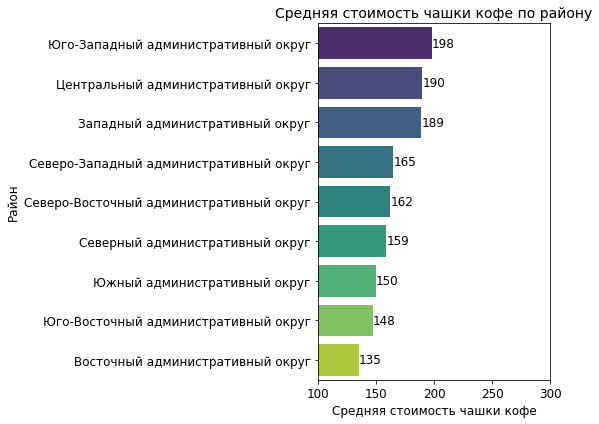

In [61]:
# визуализация
plt.figure(figsize=(8, 6))
ax = sns.barplot(data=df_midian_coffee_cup, y='district', x='mean_bill', palette='viridis')
ax.set_title('Средняя стоимость чашки кофе по району', fontsize=14)
ax.set_xlabel('Средняя стоимость чашки кофе', fontsize=12)
ax.set_ylabel('Район', fontsize=12)
ax.set_xlim(100, 300)
for p in ax.patches:
    width = p.get_width()
    ax.text(width, p.get_y() + p.get_height() / 2., '{:0.0f}'.format(width), ha='left', va='center', size=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


В Центральном, Западном и Юго-Западном округах находится самый дорогой кофе, средняя его стоимость составляет 180, в то время как в среднем по Москве цена за чашку кофе равна 171. Если вы собираетесь открыть новое кафе, рекомендуется определить цену на кофе исходя из района, в котором находится ваше заведение, не превышая средней цены в этом районе.

При запуске новой кофейни рекомендуется выбрать Центральный, Западный или Юго-Западный округа, поскольку здесь средняя стоимость кофе выше, что позволит получить хорошую прибыль. Это также позволит начать дело со сниженной ценой на кофе без больших потерь.

Стоит обдумать возможность круглосуточной работы. Западный и Юго-Западный округа являются дефицитными регионами в плане круглосуточных заведений. В Центральном округе будет лучше воспользоваться форматом 24/7, так как это самый оживленный район с большим количеством пешеходных улиц и оживлен в темное время суток. Соответственно оптимальный вектор в стратегии открытия и развития кофейни в Западном круге и Юго-Западный округе  - качество обслуживания.

## Общий вывод

* Наиболее популярные категории заведений общественного питания в Москве - кафе, ресторан, кофейня, наименее популярны булочные и столовые.
* В ресторанах, барах и кофейнях медианные значения количества посадочных мест равны 80 и более. Наименьшее медианное значение по посадочным местам наблюдается в кафе, пиццериях и булочных: 60, 55, 50 мест соответственно.
* Несетевых заведений больше сетевых в соотношении 61,9% против 38,1%. Чаще сетевыми заведениями являются кофейни, пиццерии и булочные - более 50% заведений. Наиболее редки сетевые заведения в категориях "бар,паб" и "столовая"
* Большая часть сетевых заведений из топ-15 по популярности относится к категории 'Кофейня'. Наименее популярная категория – 'булочная'
* В Центральном Административном Округе количество заведений более чем в 2 раза превышает количество заведений в других округах. Наименьшее количество заведений в Северо-западном административном округе Москвы
* По количеству заведений лидирует проспект Мира - 184 заведений, в конце списка улица Пятницкая - 48 заведений.
* Наиболее высокие оценки получают бары и пабы, самые низкие - заведения быстрого питания.
* Максимальный средний рейтинг у заведений в Центральном Административном округе
* Самый высокий средний чек в Центральном и Западном административных округах
* В Центральном и Западном административных округах самая высокая средняя стоимость чашки кофе

Рекомендации по октрытию кофейни:

* рекомендуется выбрать Центральный, Западный или Юго-Западный округа, поскольку здесь средняя стоимость кофе выше, что позволит получить хорошую прибыль. Это также позволит начать дело со сниженной ценой на кофе без больших потерь.

* Стоит обдумать возможность круглосуточной работы. Западный и Юго-Западный округа являются дефицитными регионами в плане круглосуточных заведений. 
* В Центральном округе будет лучше воспользоваться форматом 24/7, так как это самый оживленный район с большим количеством пешеходных улиц и оживлен в темное время суток.
* Соответственно оптимальный вектор в стратегии открытия и развития кофейни в Западном круге и Юго-Западный округе  - качество обслуживания.

Ссылка на презинтацию https://disk.yandex.ru/i/mQJKLC4nGsGE4A

Для некоторых случаев придется использовать параметр 

        color_discrete_map={}
        
например для px.bar()        

Или словарь цветов,  чтобы точно присвоить определенный цвет каждой категории